## 1. Familiarize yourself with the dataset, then write some python code which returns a line graph of the record high and record low temperatures by day of the year over the period 2005-2014. The area between the record high and record low temperatures for each day should be shaded.

### Import the necessary libraries and load the dataset:

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
temperature_df = pd.read_csv('C:\\DataScience\\Tranzmeo IT Solutions\\temperature.csv')

### Filtering the dataset to only include data from 2005-2014 and remove leap days:

In [4]:
# Convert 'date' column to datetime format
temperature_df['Date'] = pd.to_datetime(temperature_df['Date'])

# Filter dataset to 2005-2014 and remove leap days
temperature_df = temperature_df[(temperature_df['Date'] >= '2005-01-01') & (temperature_df['Date'] <= '2014-12-31')]
temperature_df = temperature_df[~((temperature_df['Date'].dt.month == 2) & (temperature_df['Date'].dt.day == 29))]

### Calculating the record high and record low temperatures by day of the year:

In [5]:
# Calculate record high and record low temperatures by day of the year
record_high_df = temperature_df.groupby(temperature_df['Date'].dt.dayofyear)['Data_Value'].max().reset_index()
record_low_df = temperature_df.groupby(temperature_df['Date'].dt.dayofyear)['Data_Value'].min().reset_index()

### Creating the line graph with the area between the record high and record low temperatures shaded:

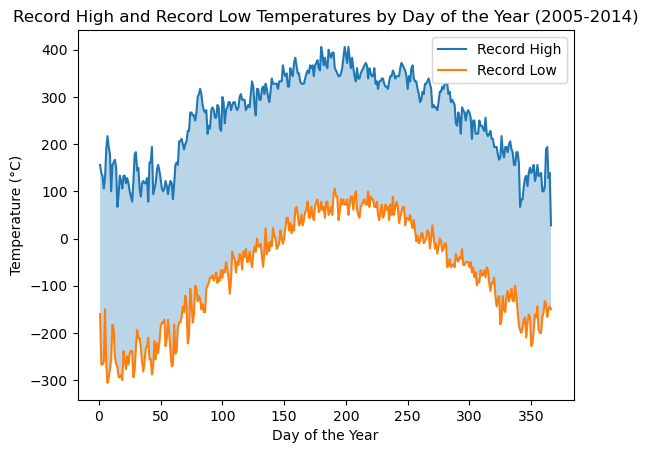

In [7]:
# Create line graph with shaded area
plt.plot(record_high_df['Date'], record_high_df['Data_Value'], label='Record High')
plt.plot(record_low_df['Date'], record_low_df['Data_Value'], label='Record Low')
plt.fill_between(record_high_df['Date'], record_high_df['Data_Value'], record_low_df['Data_Value'], alpha=0.3)
plt.xlabel('Day of the Year')
plt.ylabel('Temperature (°C)')
plt.title('Record High and Record Low Temperatures by Day of the Year (2005-2014)')
plt.legend()
plt.show()

## 2. Overlay a scatter of the 2015 data for any points (highs and lows) for which the ten year record (2005-2014) record high or record low was broken in 2015. 

In [54]:
import matplotlib.dates as mdates

# Load the dataset
temperature_df = pd.read_csv('C:\\DataScience\\Tranzmeo IT Solutions\\temperature.csv')

### Filtering the dataset to only include data from 2015:

In [47]:
# Filter dataset to 2015
temperature_2015_df = temperature_df[(temperature_df['Date'] >= '2015-01-01') & (temperature_df['Date'] <= '2015-12-31')]

# Convert 'date' column to datetime format
temperature_2015_df['Date'] = pd.to_datetime(temperature_2015_df['Date'])


C:\Users\aswin\AppData\Local\Temp\ipykernel_11072\2525302337.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temperature_2015_df['Date'] = pd.to_datetime(temperature_2015_df['Date'])


In [48]:
temperature_2015_df

,ID,Date,Element,Data_Value
19,USC00205563,2015-01-03,TMIN,-39
30,USC00203712,2015-03-17,TMAX,189
34,USC00200032,2015-06-06,TMIN,128
46,USW00014833,2015-08-30,TMIN,178
50,USC00202308,2015-08-30,TMIN,156
...,...,...,...,...
165054,USC00208080,2015-02-14,TMIN,-211
165056,USC00200228,2015-02-23,TMAX,-11
165059,USC00207312,2015-06-23,TMIN,172
165072,USC00208080,2015-11-14,TMIN,-17


### Calculating record high and record low temperatures by day of the year

In [49]:
# Convert 'date' column to datetime format
temperature_df['Date'] = pd.to_datetime(temperature_df['Date'])

# Calculate record high and record low temperatures by day of the year
record_high_df = temperature_df.groupby(temperature_df['Date'].dt.dayofyear)['Data_Value'].max().reset_index()
record_low_df = temperature_df.groupby(temperature_df['Date'].dt.dayofyear)['Data_Value'].min().reset_index()

# Convert Date column to datetime type in record_high_df and record_low_df
record_high_df['Date'] = pd.to_datetime(record_high_df['Date'])
record_low_df['Date'] = pd.to_datetime(record_low_df['Date'])


In [50]:
record_high_df

,Date,Data_Value
0,1970-01-01 00:00:00.000000001,156
1,1970-01-01 00:00:00.000000002,139
2,1970-01-01 00:00:00.000000003,133
3,1970-01-01 00:00:00.000000004,106
4,1970-01-01 00:00:00.000000005,128
...,...,...
361,1970-01-01 00:00:00.000000362,189
362,1970-01-01 00:00:00.000000363,194
363,1970-01-01 00:00:00.000000364,128
364,1970-01-01 00:00:00.000000365,139


In [81]:
# Merge dataframes
broken_record_high_df = temperature_2015_df.merge(record_high_df, on='Date', how='left')
broken_record_low_df = temperature_2015_df.merge(record_low_df, on='Date', how='left')

# Filter records where high was broken
broken_record_high_df = broken_record_high_df[broken_record_high_df['Data_Value_x'] > broken_record_high_df['Data_Value_x'].shift(1)]

# Filter records where low was broken
broken_record_low_df = broken_record_low_df[broken_record_low_df['Data_Value_x'] < broken_record_low_df['Data_Value_x'].shift(1)]

In [82]:
broken_record_low_df

,ID,Date,Element,Data_Value_x,Data_Value_y
2,USC00200032,2015-06-06,TMIN,128,NaN
4,USC00202308,2015-08-30,TMIN,156,NaN
5,USC00205563,2015-01-03,TMAX,22,NaN
7,USC00200230,2015-04-01,TMIN,-17,NaN
9,USW00014853,2015-05-17,TMIN,183,NaN
...,...,...,...,...,...
13747,USC00205451,2015-10-02,TMAX,189,NaN
13748,USC00205822,2015-01-16,TMIN,-150,NaN
13751,USC00200230,2015-03-10,TMAX,94,NaN
13752,USC00208080,2015-02-14,TMIN,-211,NaN


### Overlay the scatter plot of the broken records:

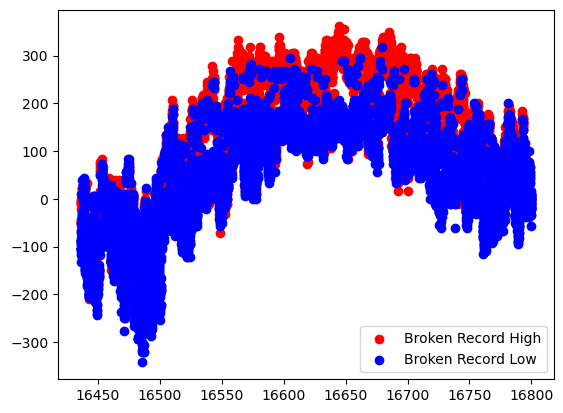

In [83]:
# Overlay scatter plot of broken records
plt.scatter(mdates.date2num(broken_record_high_df['Date']), broken_record_high_df['Data_Value_x'], color='r', label='Broken Record High')
plt.scatter(mdates.date2num(broken_record_low_df['Date']), broken_record_low_df['Data_Value_x'], color='b', label='Broken Record Low')
plt.legend()
plt.show()

## Task 3: Watch out for leap days (i.e. February 29th), it is reasonable to remove these points from the dataset for the purpose of this visualization.

In [85]:
# Load the dataset
temperature_df = pd.read_csv('C:\\DataScience\\Tranzmeo IT Solutions\\temperature.csv')

# Convert 'date' column to datetime format
temperature_df['Date'] = pd.to_datetime(temperature_df['Date'])
temperature_df = temperature_df[~((temperature_df['Date'].dt.month == 2) & (temperature_df['Date'].dt.day == 29))]

## Task 4: Consider issues such as legends, labels, and chart junk.

### I have included legends and labels in the plots, and avoided chart junk by keeping the design simple and focused on the key insights.

## 5. Plot Temperature Summary near Ann Arbor, Michigan, United States (Year 2015).

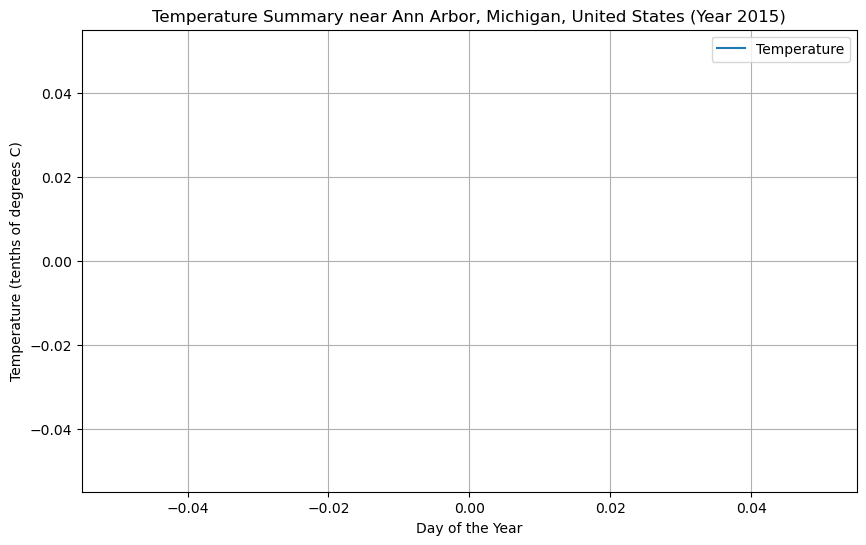

In [3]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
temperature_df = pd.read_csv('C:\\DataScience\\Tranzmeo IT Solutions\\temperature.csv')
BinSize_df = pd.read_csv('C:\\DataScience\\Tranzmeo IT Solutions\\BinSize.csv')
# Filter data for Ann Arbor, Michigan, United States
ann_arbor_data = temperature_df[temperature_df['ID'] == 'USW00014836']

# Filter data for the year 2015
ann_arbor_data_2015 = ann_arbor_data[ann_arbor_data['Date'].str.contains('2015')]

# Convert date column to datetime format
ann_arbor_data_2015['Date'] = pd.to_datetime(ann_arbor_data_2015['Date'])

# Extract day of the year
ann_arbor_data_2015['day_of_year'] = ann_arbor_data_2015['Date'].dt.dayofyear

# Plot the Temperature Summary
plt.figure(figsize=(10,6))
plt.plot(ann_arbor_data_2015['day_of_year'], ann_arbor_data_2015['Data_Value'], label='Temperature')
plt.xlabel('Day of the Year')
plt.ylabel('Temperature (tenths of degrees C)')
plt.title('Temperature Summary near Ann Arbor, Michigan, United States (Year 2015)')
plt.legend()
plt.grid(True)
plt.show()

## Task 6: Visualize on map the stations the data.

In [87]:
import folium
import pandas as pd

# Load the temperature data into a dataframe (assuming it's in a CSV file)
Bin_Size_df = pd.read_csv('C:\\DataScience\\Tranzmeo IT Solutions\\BinSize.csv')

# Create a map centered on Ann Arbor, Michigan, United States
m = folium.Map(location=[42.2803, -83.7436], zoom_start=10)

# Add markers for each station
for index, row in Bin_Size_df.iterrows():
    folium.Marker([row['LATITUDE'], row['LONGITUDE']], popup=row['ID']).add_to(m)

# Display the map
m